# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Students
- 0001132284 - Luca Babboni - Luca.babboni2@studio.unibo.it 
- 0001116370 - Paul Ioan Clotan - paulioan.clotan@studio.unibo.it 
- 0001131730 - Norberto Casarin - norberto.casarin@studio.unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

In [238]:
#Lists of imports
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Define the path to the dataset
models_path = r"dataset/dataset/models"
scene_path = r"dataset/dataset/scenes"

In [239]:
#We create a class that contains all the functions that we will use in the assignment

class Assignement_Functions():
    def __init__(self):
        self.sift = cv2.SIFT_create()
        # Defining index for approximate kdtree algorithm
        FLANN_INDEX_KDTREE = 1
        # Defining parameters for algorithm
        
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        # Defining search params.
        # checks=50 specifies the number of times the trees in the index should be recursively traversed.
        # Higher values gives better precision, but also takes more time
        search_params = dict(checks = 50)
        # Initializing matcher
        self.flann = cv2.FlannBasedMatcher(index_params, search_params)

        #Defining bfmatcher with default parameters
        self.bf = cv2.BFMatcher()

    def show_image(self, image, title=None):
        """
        Show an image

        image: image to show
        title: title of the image
        """

        if title is not None:
            plt.title(title)
        plt.imshow(image)
        plt.show()

    def read_image(self, path, convert_to_rgb = True, print_image = False): 
        """
        Read an image from the path and convert it to RGB if needed

        path: path of the image
        convert_to_rgb: convert the image to RGB
        print_image: print the image

        return: the image
        """
        img_model = cv2.imread(path)
        if convert_to_rgb:
            img_model = cv2.cvtColor(img_model, cv2.COLOR_BGR2RGB)

        if print_image:
            self.show_image(img_model)

        return img_model

    def print_img_list(self, images, titlese):
        """
        Print a list of images

        images: list of images to print
        titlese: list of titles of the images
        """
        for img, title in zip(images, titlese):
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(title)
            plt.show()

    def print_img_list_grid(self, images, titles, cols=4, figsize=(20, 20)):
        """
        Print a list of images in a grid
        
        images: list of images to print
        titles: list of titles of the images
        cols: number of columns in the grid
        figsize: size of the figure
        """
        n = len(images)
        rows = n // cols
        rows += n % cols
        plt.figure(figsize=figsize)
        fig, axs = plt.subplots(rows, cols, figsize=(20, 20))
        axs = axs.flatten()
        i = 0
        for img, title in zip(images, titles):
            axs[i].imshow(img)
            axs[i].set_title(title)
            i += 1
        plt.show()

    def detect_kp(self, img, print_images=False, print_keypoints_count=False):
        """
        Detect the keypoints in the image

        param img: image to calculat the keypoint on
        param print_images: print the image with a representation of the keypoint found
        param print_keypoints_count: print the number of keypoint

        return: keypoints and descriptors of the image
        """

        #Used to find the keypoints and descriptors with SIFT
        kp_img = self.sift.detect(img)

        if print_images:
            img_visualization_scene = cv2.drawKeypoints(img, kp_img, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            self.show_image(img_visualization_scene, "Keypoint Found")

        if print_keypoints_count:
            print("Number of keypoint in the image: ", len(kp_img))

        kp_img, des_img = self.sift.compute(img, kp_img)

        return kp_img, des_img
    
    def denoise(self, image, print_images=False):
        """
        Denoise the image using the following steps:
        - Median filter
        - Gaussian filter
        - Non-local means filter
        - Sharpening filter

        param image: image to denoise
        param print_images: print the images

        return: denoised image
        """
        img_scene_firstMedian = cv2.medianBlur(image, 5)
        gaussian_filter = cv2.GaussianBlur(img_scene_firstMedian,(5,5),1)
        dst = cv2.fastNlMeansDenoisingColored(gaussian_filter,None,12,12,7,21)

        sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
        sharpened_image = cv2.filter2D(dst, -1, sharpen_kernel)

        if print_images:
            self.print_img_list_grid([image, sharpened_image], ['Original', 'Denoised'], cols=2)

        return sharpened_image

    def get_good_matches(self, des_model, des_scene, matching_algorithm='flann'):
        """
        Get the good matches between the model and scene images

        param des_model: descriptors of the model image
        param des_scene: descriptors of the scene image
        param matching_algorithm: algorithm to use for the matching ('flann' or 'bf')
        """

        if matching_algorithm == 'flann':
            matches = self.flann.knnMatch(des_model,des_scene,k=2)
        elif matching_algorithm == 'bf':
            matches = self.bf.knnMatch(des_model, des_scene, k=2)
        else:
            raise ValueError("Matching algorithm must be either 'flann' or 'bf'")

        # Calculate the good matches
        good_matches = []
        for m,n in matches:
            if m.distance < 0.7*n.distance:
                good_matches.append(m)

        return good_matches

    def get_homography(self, kp_model, kp_scene, good_matches):
        """
        Get the homography matrix between the model and scene images

        param kp_model: keypoints of the model image
        param kp_scene: keypoints of the scene image
        param good_matches: good matches between the model and scene images

        return: homography matrix and mask
        """

        # Building the correspondents arrays of good matches
        src_pts = np.float32([ kp_model[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp_scene[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
        
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        return M, mask

    #Get the destination points of the model image in the scene image (the corner of the square surrounding the model in the scene image)
    def get_dst_point(self, M, model_shape):
        """
        Get the destination points of the model image in the scene image (corner of the square surrounding the model in the scene image)

        M: homography matrix
        model_shape: shape of the model image (height, width)

        return: corner of the square surrounding the model in the scene image
        """

        h,w = model_shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        # Projecting the corners into the train image
        dst_point =  cv2.perspectiveTransform(pts,M)
        return dst_point

    #The function used to remove the keypoint inside an already detected model 
    def remove_invalid_kp(self, kp_scene, des_scene, dst_point):
        """
        Remove the keypoints and descriptors of the image scene that habe been detected inside the model image

        kp_scene: keypoints of the scene image
        des_scene: descriptors of the scene image
        dst_point: corner of the square surrounding the model in the scene image

        return: keypoints and descriptors of the scene image that are not inside the model image
        """
        kp_scene_filtered = []
        des_scene_filtered = []
        for kp, des in zip(kp_scene, des_scene):
            if cv2.pointPolygonTest(dst_point, kp.pt, False) == -1:
                kp_scene_filtered.append(kp)
                des_scene_filtered.append(des)
        return np.array(kp_scene_filtered), np.array(des_scene_filtered)

    #A function that calculates the dimension of the product in the scene image starting from the destination points
    def get_product_dimension(self, dst_point):
        """
        Calculate the dimension of the product in the scene image starting from the destination points

        dst_point: corner of the square surrounding the model in the scene image

        return: the position of the upper left corner, the width and the height of the product in the scene image
        """
        upper_left_corner = (int(dst_point[0][0][0]), int(dst_point[0][0][1]))
        bottom_right_corner = (int(dst_point[2][0][0]), int(dst_point[2][0][1]))

        width = bottom_right_corner[0] - upper_left_corner[0]
        height = bottom_right_corner[1] - upper_left_corner[1]

        return upper_left_corner, width, height

    def add_match_to_report(self, model_name, dst_point, report): 
        """
        Add the match between the model and scene images to the report dictionary

        model_name: name of the model image
        scene_name: name of the scene image
        dst_point: corner of the square surrounding the model in the scene image
        report: report dictionary
        """
        if model_name not in report:
            report[model_name] = {}
            report[model_name]['dst_point'] = []
            report[model_name]['count'] = 0

        report[model_name]['dst_point'].append(dst_point)
        report[model_name]['count'] += 1

    def print_report(self, report):
        """
        Print the report of the matching between the model and scene images

        report: report of the matching
        """
        
        #get the keys of the report dictionary and sort them\
        models = list(report.keys())
        models.sort()

        for model in models:
            print(model, ' - ', report[model]['count'], ' instance found:')
            for idx, dst_point in enumerate(report[model]['dst_point']):
                upper_left_corner, width, height = self.get_product_dimension(dst_point)
                print(f"\t Instance {idx} position: {upper_left_corner} width: {width} height: {height}")
        print('\n', '-'*50, '\n'*2)

    def compute_adjusted_threshold(self, dst_point, alpha = 1500):
        '''
        Computes the THRESHOLD_GOOD_MATCHES parameter dynamically.
        
        formula: 2 * int(((transformed_width * transformed_height) / (base_width * base_height))*100)
        transformed_width - width of the current reference image detected into the scene
        transformed_height - height of the current reference image detected into the scene
        base_width - original width of the ref image(as it was read)
        base_height - original height of the ref image(as it was read)
        
        '''
     
        #We get the dimension of the image in the scene that we are analyzing
        _, transformed_width, transformed_height = af.get_product_dimension(dst_point)

        if transformed_width > 0 and transformed_height > 0:
            computed_threshold = (transformed_width * transformed_height) / alpha
        else:
            #We the computed threshold to an arbitarile high number, 
            #such that the algorithm does not get stuck detecting the same instance of an image multiple times(threshold 0 case)
            computed_threshold = 100
        
        computed_threshold = computed_threshold if computed_threshold > 1 else 100

        return computed_threshold
    
    def draw_box_with_ref(self, img_scene, dst_point, best_fitting_model):
            '''
            Draw a box around the reference image detected in the scene image
            '''
            #We draw the rectangle around the model in the scene image, and a red circle in the upper left corner
            cv2.polylines(img_scene, [np.int32(dst_point)], True, (0,255,0), 10)
            cv2.circle(img_scene, (int(dst_point[0][0][0]), int(dst_point[0][0][1])), 10, (255, 0, 0), -1)
            #We put the name of the model in the scene image
            cv2.rectangle(img_scene, (int(dst_point[0][0][0]), int(dst_point[0][0][1])), (int(dst_point[0][0][0]) + 170, int(dst_point[0][0][1]) + 90), (255, 255, 255), -1) 
            cv2.putText(img_scene, best_fitting_model.get_name(), (int(dst_point[0][0][0]), int(dst_point[0][0][1]) + 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 5, cv2.LINE_AA)
            
            

            return img_scene

af = Assignement_Functions()

# Explanation of the proposed solution 

The proposed workflow for the instance detector ha been generalized in an algorith that can be run in both of the task. This mean that is is capable to work with single of multi instances of the same product without any problem. 


## Process description 
**Preparation procedure**: 
1. Compute the keypoint and the descriptors of the all the models, and then cache it. This is going to speed up the computation for later.   

**Detection step**:

Cycle through the scene images taking the following steps:
1. **Denoise** the scene image
2. **Extract keypoints** from the denoised scene image
3. Detection cicle: 
    - **Compute the matches** between the scene keypoint and all the cached model keypoints
    - Considering only the model with more matches (best fitting model): 
    - **Compute the homography of the best fitting model** 
    - Controll if the detection is considered as a match checking if the **N_matching_kp > threshold**. The threshold can be a constant or calculated by an automated process that we designed (more about this later). 
    - If the model is considere as a match **add it to the report and delete the associated keypoint**. Removing the keypoint allow us to operate again the matching process without requiring masking out the product and reoperating the keypoint detection algorithm. It results in a significant drop of the time needed to analyze an image. 
    - If **no model detected the test fails the detection cicle terminates**.  
4. Draw boxes surrounding the products and add each image to an array of detected product
5. Print the report

## Denoising procedure
The denoising procedure has been composed as a pipeline of the following filters. We choose this pipeline after multiple attempt with different configurations of filteres and parameters.


The final pipeline is composed as:
1. Median Filter
2. Gaussian Filter
3. Non Local Mean Filter
4. Convolution with a Sharpen_kernel

we also get good results using a simple pipeline consisting of a  Median Filter and a Bilateral filter but we found this combination bringing to overall worst results than the previus one.

<Figure size 2000x2000 with 0 Axes>

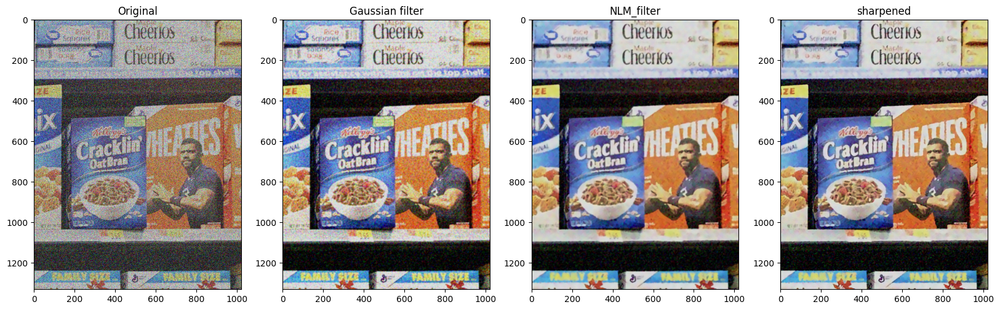

In [240]:
#example of the results of the denoising procedure
img = af.read_image('dataset\dataset\scenes\scene5.png', convert_to_rgb = True, print_image = False)

img_scene_firstMedian = cv2.medianBlur(img, 5)
gaussian_filter = cv2.GaussianBlur(img_scene_firstMedian,(5,5),1)
NLM_filter = cv2.fastNlMeansDenoisingColored(gaussian_filter,None,12,12,7,21)

sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened_image = cv2.filter2D(NLM_filter, -1, sharpen_kernel)

af.print_img_list_grid([img, gaussian_filter, NLM_filter, sharpened_image], ['Original', 'Gaussian filter', 'NLM_filter', 'sharpened'], cols=4)

## Algorithm for dinamically estimate the threshold
Our algorithm operates by checking if the number of matches between the product and the model is sufficient, and if they exceed a certain threshold. Since products within images can appear in different sizes, having a rigid threshold could create problems, preventing the detection of small products (with few keypoints) and at the same time generating large artifacts. For this reason, an algorithm for automatic threshold detection has been developed.

$$trd =  \frac{(Prod_{Width} * Prod_{Heigh})}{alpha}$$


where: 

- ```prod_width```: is the width of the detected product in the scene
- ```prod_height``` is the height of the the detected product in the scene

Our intention was to create a proportion between the area of the identified product and an alpha hyper-parameter, which will adjust how much the threshold should vary depending on the area.


# Task A

## 1. Compute all the model keypoint and relative description

Read the models from 1 to 14 from the selected folder

In [241]:
#List all the file contained in the model_path folder
models_paths_list = os.listdir(models_path)

#Filter the filenames and keep only the ones with number less than 14
models_paths_list_task_A = [mp for mp in models_paths_list if int(mp[3:].split(".")[0]) <= 14]

#Sort the files names by number contained in the name
models_paths_list_task_A = sorted(models_paths_list_task_A, key=lambda x: int(x[3:].split(".")[0]))

In order to have an organized way to store the characteristics of an image (keypoint, descriptors, dimensions, and name), we create a new class called `Model_Description`.

In [242]:
class Model_Description():
    def __init__(self, name, kp, des, model_shape):
        self.name = name
        self.kp = kp
        self.des = des
        self.model_shape = model_shape

    def get_name(self):
        return self.name

    def get_kp(self):
        return self.kp

    def get_des(self):
        return self.des
    
    def get_model_shape(self):
        return self.model_shape

    def __str__(self):
        return "obj containing kp and des for img: " + self.name

We create a new Model_Description for each model and then store them inside an array.

The reason behind this process is having all the keypoints and descriptors already computed to speed up the matching process by a considerable amount.

In [243]:
#We create a list Model Description
model_descriptions = []

#We iterate through the list of model paths and create a Model_Description object for each image.
for mp in models_paths_list_task_A:
    img = af.read_image(os.path.join(models_path, mp), convert_to_rgb = True, print_image = False)
    kp_img, des_img = af.detect_kp(img)
    #We delete the extension from the name of the image
    img_name = mp.split(".")[0]
    model_descriptions.append(Model_Description(img_name, kp_img, des_img, img.shape))


## 2. Cycle through the scene images.

Now we are going to cycle through the models and search for the best matching one.

In [244]:
#List all the file contained in the model_path folder
scene_paths_list = os.listdir(scene_path)

#Filter the filenames and keep only the ones with number less than 5, for the first task
scene_paths_list_task_A = [sp for sp in scene_paths_list if int(sp[5:].split(".")[0]) <= 5]

#Sort the files names by number contained in the name
scene_paths_list_task_A = sorted(scene_paths_list_task_A, key=lambda x: int(x[5:].split(".")[0]))

In [245]:
# PARAMETERS OF THE PROCEDURE

#We create two lists for the model images, the areas of the detected models and the number of keypoints
areas = []
kp_number = []

#Create a flag to automatically adjust the threshold based on the size of the detected object
AUTOMATIC_THRESHOLD_GOOD_MATCHES = True
ALPHA = 3500

#We create a threshold for the number of good matches, in case the automatic threshold is not used
THRESHOLD_GOOD_MATCHES = 45

#We then use the "flann" algorithm to find the best matches
MATCHING_ALGORITHM = 'flann'

#Setting the verbose flag to True to print the results of the matching
VERBOSE = True

Scene  scene1.png
ref1  is present in the scene  Threshold: 241, number of matches: 637, model: ref1, box_area: 842.347
ref2  is present in the scene  Threshold: 240, number of matches: 559, model: ref2, box_area: 841.544
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

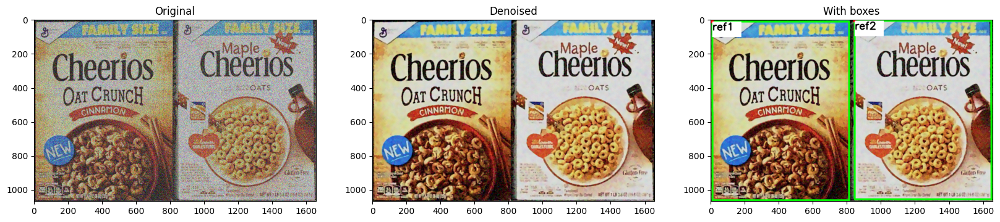

ref1  -  1  instance found:
	 Instance 0 position: (10, 14) width: 803 height: 1049
ref2  -  1  instance found:
	 Instance 0 position: (846, 9) width: 803 height: 1048

 -------------------------------------------------- 


Scene  scene2.png
ref5  is present in the scene  Threshold: 135, number of matches: 312, model: ref5, box_area: 472.64
ref3  is present in the scene  Threshold: 162, number of matches: 310, model: ref3, box_area: 567.76
ref4  is present in the scene  Threshold: 171, number of matches: 301, model: ref4, box_area: 600.081
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

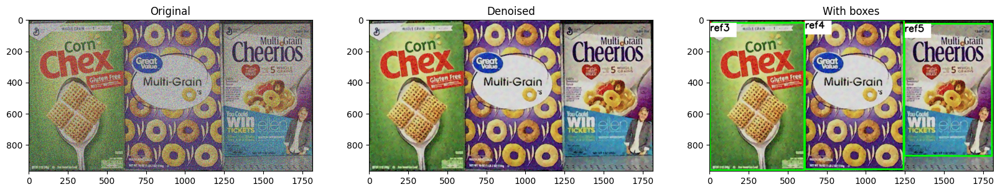

ref3  -  1  instance found:
	 Instance 0 position: (3, 23) width: 604 height: 940
ref4  -  1  instance found:
	 Instance 0 position: (611, 6) width: 631 height: 951
ref5  -  1  instance found:
	 Instance 0 position: (1248, 28) width: 560 height: 844

 -------------------------------------------------- 


Scene  scene3.png
ref8  is present in the scene  Threshold: 124, number of matches: 191, model: ref8, box_area: 434.124
ref6  is present in the scene  Threshold: 115, number of matches: 119, model: ref6, box_area: 402.67
ref7  is present in the scene  Threshold: 101, number of matches: 105, model: ref7, box_area: 352.07
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

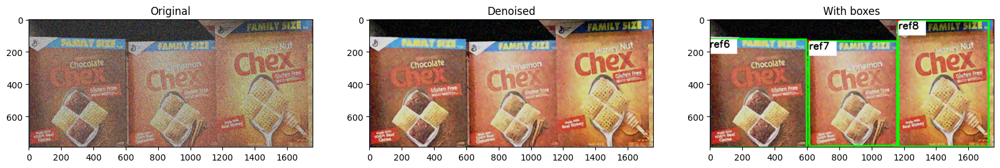

ref6  -  1  instance found:
	 Instance 0 position: (-2, 123) width: 601 height: 670
ref7  -  1  instance found:
	 Instance 0 position: (614, 135) width: 545 height: 646
ref8  -  1  instance found:
	 Instance 0 position: (1167, 9) width: 558 height: 778

 -------------------------------------------------- 


Scene  scene4.png
ref1  is present in the scene  Threshold: 55, number of matches: 223, model: ref1, box_area: 191.0
ref8  is present in the scene  Threshold: 49, number of matches: 87, model: ref8, box_area: 170.661
ref9  is present in the scene  Threshold: 43, number of matches: 76, model: ref9, box_area: 150.552
ref10  is present in the scene  Threshold: 30, number of matches: 56, model: ref10, box_area: 106.656
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

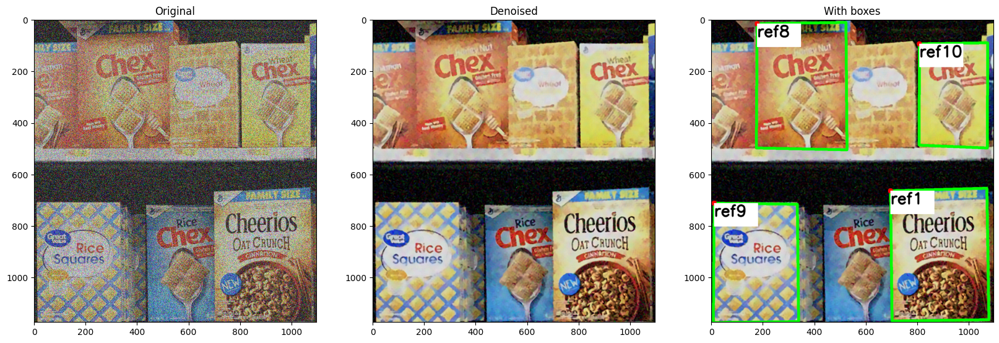

ref1  -  1  instance found:
	 Instance 0 position: (696, 665) width: 382 height: 500
ref10  -  1  instance found:
	 Instance 0 position: (808, 95) width: 264 height: 404
ref8  -  1  instance found:
	 Instance 0 position: (178, 17) width: 349 height: 489
ref9  -  1  instance found:
	 Instance 0 position: (11, 713) width: 328 height: 459

 -------------------------------------------------- 


Scene  scene5.png
ref11  is present in the scene  Threshold: 58, number of matches: 150, model: ref11, box_area: 203.318
ref12  is present in the scene  Threshold: 79, number of matches: 85, model: ref12, box_area: 275.847
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

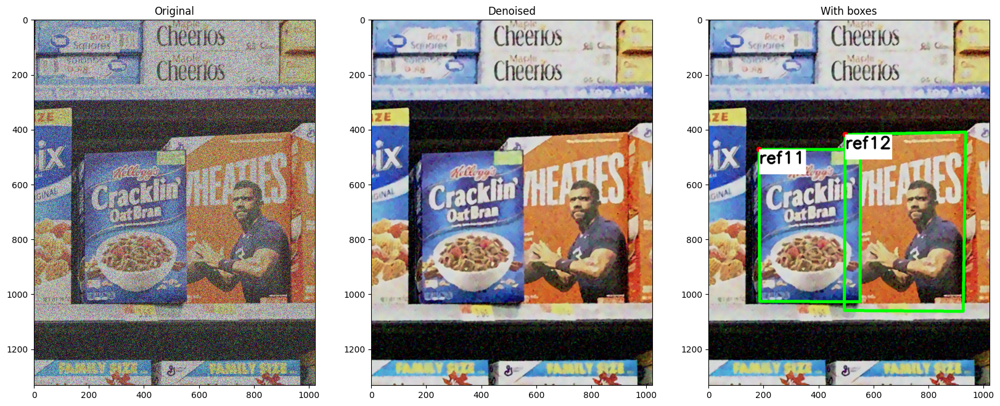

ref11  -  1  instance found:
	 Instance 0 position: (184, 474) width: 367 height: 554
ref12  -  1  instance found:
	 Instance 0 position: (497, 420) width: 429 height: 643

 -------------------------------------------------- 




In [246]:
for idx, scene_img in enumerate(scene_paths_list_task_A):

    product_detected_report = {}

    print("Scene ", scene_img)
    
    #We read the image of the scene
    img_scene = af.read_image(os.path.join(scene_path, scene_img), convert_to_rgb = True)
    
    #Then denoise the image
    img_scene_denoised = af.denoise(img_scene, print_images=False)

    img_scene_with_boxes = img_scene_denoised.copy()
    
    #Then retrieve keypoints and descriptors of the scene.
    kp_scene, des_scene = af.detect_kp(img_scene_denoised)

    continue_search = True
    
    #We stop the search only when no sufficient good matches are found
    while continue_search:
        good_matches_count = []
        good_matches = []
        detected_models = {}

        #Then compare the scene image with each model image and get the good matches
        for model_des in model_descriptions:
            
            des_model = model_des.get_des()

            #Append the good matches for each model
            good_matches.append(af.get_good_matches(des_model, des_scene, matching_algorithm=MATCHING_ALGORITHM))
            
            #Append the number of good matches for each model
            good_matches_count.append(len(good_matches[-1]))

        #Get the index of the model with the most good matches
        max_matching_points = max(good_matches_count)
        index_max_good_matches = good_matches_count.index(max_matching_points)

        best_fitting_model = model_descriptions[index_max_good_matches]
        good_matches = good_matches[index_max_good_matches]

        #We retrieve the homography matrix
        M, mask = af.get_homography(model_descriptions[index_max_good_matches].get_kp(), kp_scene, af.get_good_matches(model_descriptions[index_max_good_matches].get_des(), des_scene))

        #And get the destination points of the model image in the scene image
        dst_point = af.get_dst_point(M, best_fitting_model.model_shape[:2])

        if AUTOMATIC_THRESHOLD_GOOD_MATCHES:
            threshold = af.compute_adjusted_threshold(dst_point, alpha = ALPHA)
        else: 
            threshold = THRESHOLD_GOOD_MATCHES

        left_corner, width, height = af.get_product_dimension(dst_point)

        #If the number of good matches is above the threshold, the model is considered to be present in the scene. 
        #We will append the name of the model to the list of models present in the scene and in the report.
        if max_matching_points >= threshold and threshold > 5:
            
            areas.append(width * height)
            kp_number.append(max_matching_points)

            if VERBOSE:
                print(model_descriptions[index_max_good_matches].get_name(), " is present in the scene ", f"Threshold: {round(threshold)}, number of matches: {max_matching_points}, model: {best_fitting_model.get_name()}, box_area: {(width * height)/1000}")


            kp_scene, des_scene = af.remove_invalid_kp(kp_scene, des_scene, dst_point)
            
            detected_models[best_fitting_model.get_name()] = dst_point
            
            #Update the report
            af.add_match_to_report(best_fitting_model.get_name(), dst_point, product_detected_report)

            #Draw the rectangle around the model in the scene image, complete with the reference
            img_scene_with_boxes = af.draw_box_with_ref(img_scene_with_boxes, dst_point, best_fitting_model)
        else:
            continue_search = False
            print("No more models detected in the scene \n" )

            
            
            if VERBOSE:
                af.print_img_list_grid([img_scene, img_scene_denoised, img_scene_with_boxes], ['Original', 'Denoised', 'With boxes'], cols=3)
                af.print_report(product_detected_report)


# Task B

We cycle through models and scenes once again, but this time we retrieve the images related to Task B

In [247]:
#List all the file contained in the model_path folder
models_paths_list = os.listdir(models_path)

#Filter the filenames and keep only the ones with number greater than 14
models_paths_list_task_B = [mp for mp in models_paths_list if int(mp[3:].split(".")[0]) >= 15]

#Sort the files names by number contained in the name
models_paths_list_task_B = sorted(models_paths_list_task_B, key=lambda x: int(x[3:].split(".")[0]))

In [248]:
#All the models
models_paths_list_task_B

['ref15.png',
 'ref16.png',
 'ref17.png',
 'ref18.png',
 'ref19.png',
 'ref20.png',
 'ref21.png',
 'ref22.png',
 'ref23.png',
 'ref24.png',
 'ref25.png',
 'ref26.png',
 'ref27.png']

In [249]:
#List all the file contained in the model_path folder
scene_paths_list = os.listdir(scene_path)

#Filter the filenames and keep only the ones with number less than 14
scene_paths_list_task_B = [sp for sp in scene_paths_list if int(sp[5:].split(".")[0]) > 5]

#Sort the files names by number contained in the name
scene_paths_list_task_B = sorted(scene_paths_list_task_B, key=lambda x: int(x[5:].split(".")[0]))

In [250]:
#All the scenes
scene_paths_list_task_B

['scene6.png',
 'scene7.png',
 'scene8.png',
 'scene9.png',
 'scene10.png',
 'scene11.png',
 'scene12.png']

We, again, create a new Model_Description for each model and then store them inside an array.

In [251]:
#We create a list Model Description
model_descriptions = []

#We iterate through the list of model paths and create a Model_Description object for each image.
for mp in models_paths_list_task_B:
    img = af.read_image(os.path.join(models_path, mp), convert_to_rgb = True, print_image = False)
    kp_img, des_img = af.detect_kp(img)
    #We delete the extension from the name of the image
    img_name = mp.split(".")[0]
    model_descriptions.append(Model_Description(img_name, kp_img, des_img, img.shape))


In [252]:
# PARAMETERS OF THE PROCEDURE

#Create a flag to automatically adjust the threshold based on the size of the detected object
AUTOMATIC_THRESHOLD_GOOD_MATCHES = True

#The alpha parameter has changed to 6000, given that the scenes contain more models
ALPHA = 6000

#We create a threshold for the number of good matches, in case the automatic threshold is not used
THRESHOLD_GOOD_MATCHES = 45

#We then use the "flann" algorithm to find the best matches
MATCHING_ALGORITHM = 'flann'

#Setting the verbose flag to True to print the results of the matching
VERBOSE = True

Scene  scene6.png
ref15  is present in the scene  Threshold: 49, number of matches: 60, model: ref15, box_area: 294.704
ref15  is present in the scene  Threshold: 51, number of matches: 60, model: ref15, box_area: 305.44
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

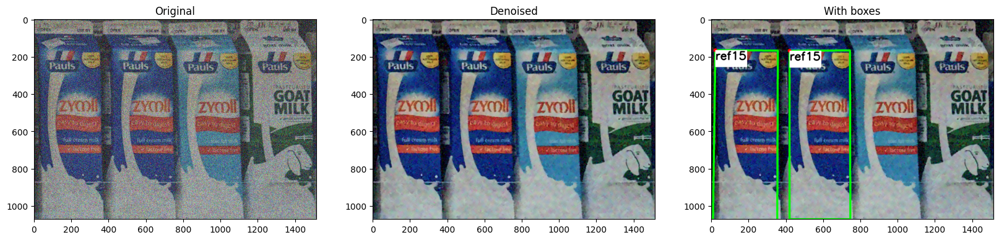

ref15  -  2  instance found:
	 Instance 0 position: (420, 169) width: 326 height: 904
	 Instance 1 position: (22, 166) width: 332 height: 920

 -------------------------------------------------- 


Scene  scene7.png
ref16  is present in the scene  Threshold: 23, number of matches: 141, model: ref16, box_area: 136.85
ref16  is present in the scene  Threshold: 22, number of matches: 136, model: ref16, box_area: 129.983
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

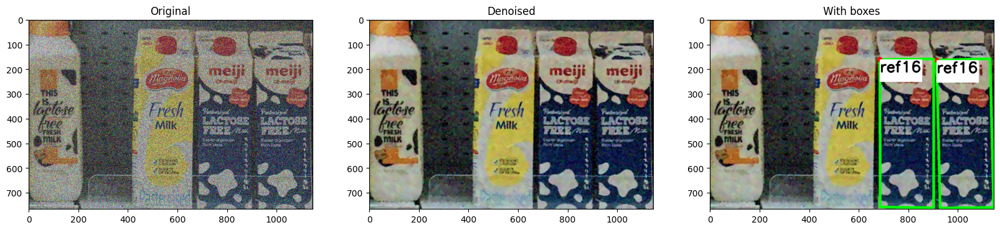

ref16  -  2  instance found:
	 Instance 0 position: (915, 165) width: 230 height: 595
	 Instance 1 position: (686, 162) width: 217 height: 599

 -------------------------------------------------- 


Scene  scene8.png
ref24  is present in the scene  Threshold: 47, number of matches: 128, model: ref24, box_area: 279.258
ref23  is present in the scene  Threshold: 47, number of matches: 130, model: ref23, box_area: 280.687
ref23  is present in the scene  Threshold: 46, number of matches: 133, model: ref23, box_area: 278.487
ref26  is present in the scene  Threshold: 27, number of matches: 45, model: ref26, box_area: 164.832
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

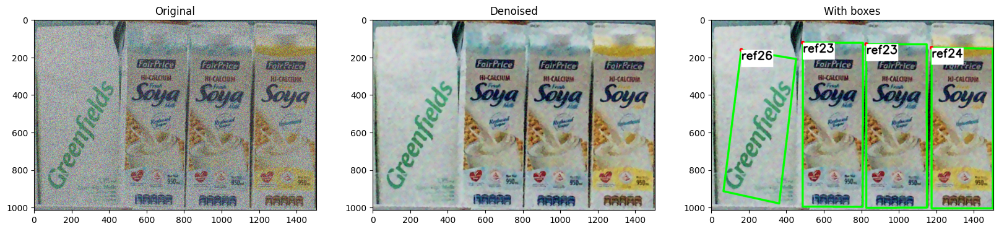

ref23  -  2  instance found:
	 Instance 0 position: (826, 132) width: 323 height: 869
	 Instance 1 position: (488, 124) width: 319 height: 873
ref24  -  1  instance found:
	 Instance 0 position: (1174, 151) width: 327 height: 854
ref26  -  1  instance found:
	 Instance 0 position: (160, 163) width: 202 height: 816

 -------------------------------------------------- 


Scene  scene9.png
ref19  is present in the scene  Threshold: 21, number of matches: 52, model: ref19, box_area: 125.44
ref19  is present in the scene  Threshold: 21, number of matches: 48, model: ref19, box_area: 124.32
ref20  is present in the scene  Threshold: 22, number of matches: 31, model: ref20, box_area: 130.036
ref20  is present in the scene  Threshold: 20, number of matches: 29, model: ref20, box_area: 122.528
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

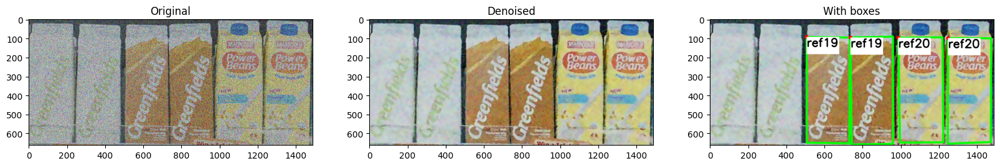

ref19  -  2  instance found:
	 Instance 0 position: (507, 93) width: 224 height: 560
	 Instance 1 position: (737, 96) width: 222 height: 560
ref20  -  2  instance found:
	 Instance 0 position: (987, 97) width: 236 height: 551
	 Instance 1 position: (1248, 99) width: 224 height: 547

 -------------------------------------------------- 


Scene  scene10.png
ref21  is present in the scene  Threshold: 29, number of matches: 40, model: ref21, box_area: 176.202
ref22  is present in the scene  Threshold: 29, number of matches: 39, model: ref22, box_area: 172.9
ref21  is present in the scene  Threshold: 29, number of matches: 51, model: ref21, box_area: 171.5
ref22  is present in the scene  Threshold: 28, number of matches: 38, model: ref22, box_area: 168.324
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

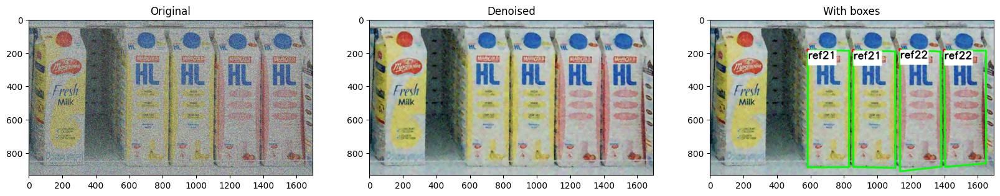

ref21  -  2  instance found:
	 Instance 0 position: (857, 187) width: 251 height: 702
	 Instance 1 position: (586, 185) width: 245 height: 700
ref22  -  2  instance found:
	 Instance 0 position: (1136, 182) width: 247 height: 700
	 Instance 1 position: (1400, 186) width: 249 height: 676

 -------------------------------------------------- 


Scene  scene11.png
ref23  is present in the scene  Threshold: 14, number of matches: 47, model: ref23, box_area: 85.974
ref17  is present in the scene  Threshold: 15, number of matches: 43, model: ref17, box_area: 89.24
ref24  is present in the scene  Threshold: 15, number of matches: 43, model: ref24, box_area: 89.573
ref24  is present in the scene  Threshold: 15, number of matches: 33, model: ref24, box_area: 91.58
ref25  is present in the scene  Threshold: 15, number of matches: 25, model: ref25, box_area: 88.755
ref25  is present in the scene  Threshold: 15, number of matches: 33, model: ref25, box_area: 88.43
ref25  is present in the scene  Th

<Figure size 2000x2000 with 0 Axes>

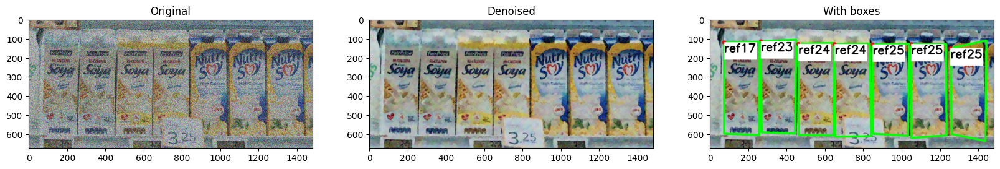

ref17  -  1  instance found:
	 Instance 0 position: (74, 121) width: 184 height: 485
ref23  -  1  instance found:
	 Instance 0 position: (266, 115) width: 178 height: 483
ref24  -  2  instance found:
	 Instance 0 position: (461, 129) width: 187 height: 479
	 Instance 1 position: (651, 130) width: 190 height: 482
ref25  -  3  instance found:
	 Instance 0 position: (1255, 152) width: 183 height: 485
	 Instance 1 position: (1050, 130) width: 185 height: 478
	 Instance 2 position: (849, 132) width: 185 height: 478

 -------------------------------------------------- 


Scene  scene12.png
ref26  is present in the scene  Threshold: 22, number of matches: 46, model: ref26, box_area: 129.21
ref26  is present in the scene  Threshold: 22, number of matches: 46, model: ref26, box_area: 132.662
No more models detected in the scene 



<Figure size 2000x2000 with 0 Axes>

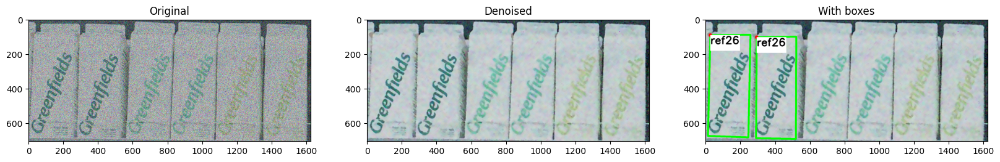

ref26  -  2  instance found:
	 Instance 0 position: (28, 92) width: 219 height: 590
	 Instance 1 position: (295, 104) width: 226 height: 587

 -------------------------------------------------- 




In [253]:
for idx, scene_img in enumerate(scene_paths_list_task_B):
    
    product_detected_report = {}
    
    print("Scene ", scene_img)

    #We read the image of the scene
    img_scene = af.read_image(os.path.join(scene_path, scene_img), convert_to_rgb = True)
    
    #Then denoise the image
    img_scene_denoised = af.denoise(img_scene, print_images=False)

    img_scene_with_boxes = img_scene_denoised.copy()
    
    #Then retrieve keypoints and descriptors of the scene.
    kp_scene, des_scene = af.detect_kp(img_scene_denoised)

    continue_search = True
    
    #We stop the search only when no sufficient good matches are found
    while continue_search:
        good_matches_count = []
        good_matches = []
        detected_models = {}

        #Then compare the scene image with each model image and get the good matches
        for model_des in model_descriptions:
            
            des_model = model_des.get_des()

            #Append the good matches for each model
            good_matches.append(af.get_good_matches(des_model, des_scene, matching_algorithm=MATCHING_ALGORITHM))
            
            #Append the number of good matches for each model
            good_matches_count.append(len(good_matches[-1]))

        #Get the index of the model with the most good matches
        max_matching_points = max(good_matches_count)
        index_max_good_matches = good_matches_count.index(max_matching_points)

        best_fitting_model = model_descriptions[index_max_good_matches]
        good_matches = good_matches[index_max_good_matches]

        #We retrieve the homography matrix
        M, mask = af.get_homography(model_descriptions[index_max_good_matches].get_kp(), kp_scene, af.get_good_matches(model_descriptions[index_max_good_matches].get_des(), des_scene))

        #And get the destination points of the model image in the scene image
        dst_point = af.get_dst_point(M, best_fitting_model.model_shape[:2])

        left_corner, width, height = af.get_product_dimension(dst_point)

        if AUTOMATIC_THRESHOLD_GOOD_MATCHES:
            threshold = af.compute_adjusted_threshold(dst_point, alpha = ALPHA)
        else: 
            threshold = THRESHOLD_GOOD_MATCHES

        #If the number of good matches is above the threshold, the model is considered to be present in the scene. 
        #We will append the name of the model to the list of models present in the scene and in the report.
        if max_matching_points >= threshold:

            if VERBOSE:
                print(model_descriptions[index_max_good_matches].get_name(), " is present in the scene ", f"Threshold: {round(threshold)}, number of matches: {max_matching_points}, model: {best_fitting_model.get_name()}, box_area: {(width * height)/1000}")


            kp_scene, des_scene = af.remove_invalid_kp(kp_scene, des_scene, dst_point)
            
            detected_models[best_fitting_model.get_name()] = dst_point
            
            #Update the report
            af.add_match_to_report(best_fitting_model.get_name(), dst_point, product_detected_report)

            #Draw the rectangle around the model in the scene image, complete with the reference
            img_scene_with_boxes = af.draw_box_with_ref(img_scene_with_boxes, dst_point, best_fitting_model)
        else:
            continue_search = False
            print("No more models detected in the scene \n" )

            if VERBOSE:
                remaining_kp = img_scene_with_boxes.copy()
                for point in kp_scene:
                    pt = point.pt
                    cv2.circle(remaining_kp, (int(pt[0]), int(pt[1])), 10, (255, 0, 0), -1)

                af.print_img_list_grid([img_scene, img_scene_denoised, img_scene_with_boxes], ['Original', 'Denoised', 'With boxes'], cols=3)
                af.print_report(product_detected_report)


                #af.print_img_list_grid([img_scene, img_scene_denoised, img_scene_with_boxes, remaining_kp], ['Original', 'Denoised', 'With boxes', 'remaining_kp'], cols=2)